In [35]:
import time, os

# Numpy
import numpy as np
import scipy
import sklearn
import pandas as pd

# Tensorflow and keras layers
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense,\
                                    Activation, ZeroPadding2D,\
                                    BatchNormalization, Flatten, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import AveragePooling2D, MaxPooling2D,\
                                    Dropout, GlobalMaxPooling2D,\
                                    GlobalAveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import activations
from tensorflow.keras import backend

# To generate GIFs


import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
from datetime import datetime

from tqdm import tqdm

import IPython
from IPython import display
import ipywidgets as widgets


In [31]:
from numpy.random import seed
from tensorflow import set_random_seed


def reset_seed():
    # Making results reproducible
    seed(10092)
    set_random_seed(10092)  

In [32]:
def create_dir(dirname):
    try:
        # Create target Directory
        os.mkdir(dirname)
        #print("dirname " , filename ,  " Created ") 
    except FileExistsError:
        print("Directory " , dirname ,  " already exists")

create_dir('models')

def preprocess_real_samples(samples):
    samples = samples.astype('float32').reshape(-1, 28, 28, 1)
    samples = (samples - samples.min()) / (samples.max() - samples.min())
    return samples


def plot_4_by_4_images(x, save = False, savefile="img.png"):
    w=10
    h=10
    fig=plt.figure(figsize=(w, h))
    columns = 4
    rows = 5
    for i in range(1, columns*rows +1):
        img = np.random.randint(x.shape[0])
        fig.add_subplot(rows, columns, i)
        plt.imshow(x[i - 1, :, :, 0], cmap='gray')
    if save:
        plt.savefig(savefile)
    plt.show()
    plt.close()


def plot_image(img):
    plt.imshow(img, cmap='gray')
    
def generate_noise_samples(n=1):
    noise = np.random.normal(0, 1, (n, 100))
    return noise


def generate_fake_samples(generator, n=1):
    noise = generate_noise_samples(n)
    X = generator.predict(noise)
    return X


def generate_and_save_images(generator, noise_test, epoch, filename):
    display.clear_output(wait=True)
    fake_images = generator.predict(noise_test)
    plot_4_by_4_images(fake_images, save=True, savefile='models/{}/img/{:04d}.png'.format(filename, epoch))

    
def train_step(generator, discriminator, gan, real_images, batch_size=64):
    real_label = np.ones((batch_size, 1))
    generated_images = generate_fake_samples(generator, batch_size)
    generated_labels = np.zeros((batch_size, 1))

    X_dis = np.concatenate([real_images, generated_images])
    y_dis = np.zeros(2*batch_size)
    y_dis[:batch_size]=0.9
        
    discriminator.trainable = True
    discriminator.train_on_batch(X_dis, y_dis)
    #discriminator.train_on_batch(x_fake, y_fake)
        
    discriminator.trainable = False
    x_gan = generate_noise_samples(batch_size)
    y_gan = np.ones((batch_size, 1)) # We assume that we wanted true as answer from the discriminator
    gan.train_on_batch(x_gan, y_gan)

def gen_csv(data_list, filename):
    pd.DataFrame(data_list, 
                 columns =['Epoch', 'Time (s)']).to_csv ('models/%s/times.csv'%(filename), index = False, header=True)

def train(generator, discriminator, gan, dataset, epochs=50, batch_size=64, filename=str(int(time.time()))):
    m = dataset.shape[0]
    m_batch = m // batch_size
    noise_test = np.random.normal(0,1, [20, 100])
    toc = time.time()
    time_data = []
    for epoch in range(epochs):
        tic = time.time()
        for batch_num in range(m_batch):
            tuc = time.time()
            #if batch_num % 30 == 0:
                #print ('[{}%] Time for epoch {} is {} sec'.format((batch_num / m_batch) * 100,epoch + 1, time.time()-tic), end='\r')
                #generate_and_save_images(noise_test, epoch, batch_num)
                #print("[%0.2f%%] Time for epoch %d is %f sec" % ( (batch_num / m_batch) * 100, epoch + 1, time.time()-tic), end='\r')
            
            batch_slot = batch_size * batch_num
            batch = dataset[batch_slot: batch_slot + batch_size]
            train_step(generator, discriminator, gan, batch, batch_size)
        time_data.append((epoch + 1, time.time()-tic))
        generate_and_save_images(generator, noise_test, epoch, filename)
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time_data[-1][1]))
    
    gen_csv(time_data, filename)
    generator.save('models/%s/generator.h5' % (filename))
    discriminator.save('models/%s/discriminator.h5' % (filename))
    gan.save('models/%s/gan.h5' % (filename))

    
def make_gif(anim_file, file_regex):
    #anim_file = 'dcgan.gif'
    fname = None
    with imageio.get_writer(anim_file, mode='I') as writer:
        filenames = glob.glob(file_regex)
        filenames = sorted(filenames)
        last = -1
        for i,filename in enumerate(filenames):
            frame = 2*(i**0.75)
            if round(frame) > round(last):
                last = frame
            else:
                continue
            image = imageio.imread(filename)
            writer.append_data(image)
        image = imageio.imread(filename)
        writer.append_data(image)

        
def format_filename(filename):
    date = datetime.now()
    date_str = "_%02d_%02d_%02d_%02d_%02d" % (date.day, date.month, date.year, date.hour, date.minute)
    create_dir('models/'+ filename)
    create_dir('models/'+ filename +"/img")
    return filename

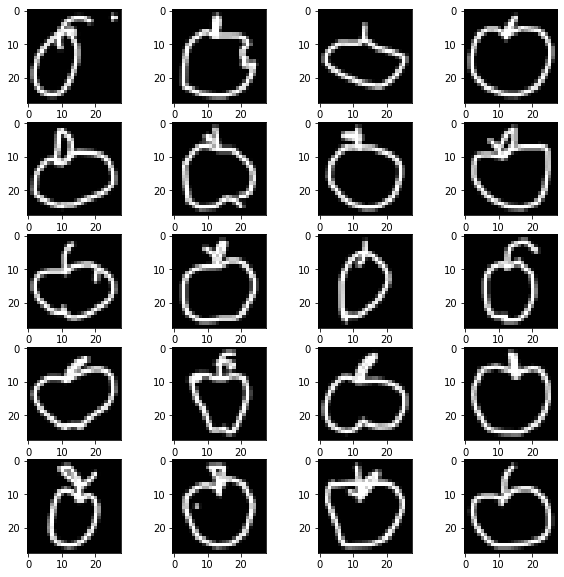

In [48]:
dataset = np.load('apple.npy')
dataset = preprocess_real_samples(dataset)
plot_4_by_4_images(dataset)

In [4]:
def full_training(generator_mod, discriminator_mod, gan_mod, n, epochs, batch_size, filename):
    # Make results reproducible
    reset_seed()
    filename = format_filename(filename)

    # Load dataset
    dataset = np.load('apple.npy')
    dataset = preprocess_real_samples(dataset) 
    #plot_4_by_4_images(dataset)
    
    generator = generator_mod()

    discriminator = discriminator_mod()

    gan = gan_mod(generator, discriminator)
    
    train(generator, discriminator, gan, dataset[:n], epochs, batch_size, filename)
    make_gif('models/%s/apple.gif'%(filename), "models/%s/img/*.png"%(filename))
    
    return 'models/%s/apple.gif'%(filename)

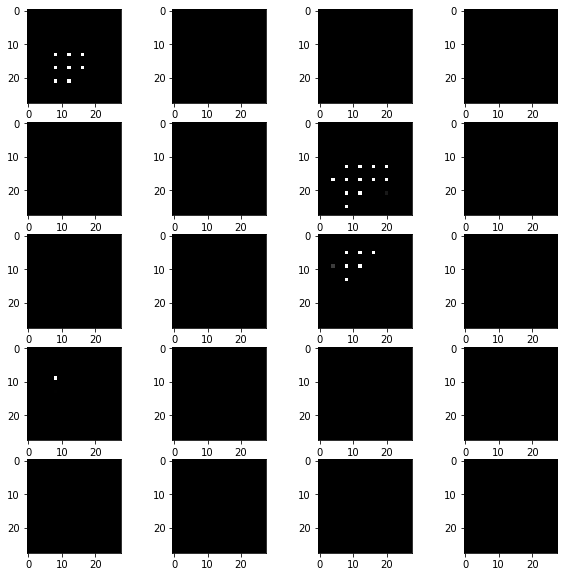

Time for epoch 50 is 12.448369264602661 sec


In [49]:
def generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    #model.add(Activation(square_activation))

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    #model.add(Activation(square_activation))    

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    #model.add(Activation(square_activation))
    
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid'))
    assert model.output_shape == (None, 28, 28, 1)
    #model.compile(loss='binary_crossentropy', optimizer='adam')
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.SGD(lr=0.01, clipvalue=0.5))
    return model


def discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.ReLU())
    #model.add(Activation(square_activation))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    #model.add(Activation(square_activation))
    model.add(layers.ReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='tanh'))
    #model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    model.compile(loss='binary_crossentropy', optimizer='sgd')
    return model


def gan_model(generator, discriminator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    #gan.compile(loss='binary_crossentropy', optimizer='adam')
    gan.compile(loss='binary_crossentropy', optimizer='sgd')
    return gan

    
animation0 = full_training(generator_model, discriminator_model, gan_model, 5000, 50, 32, 'basic_0')

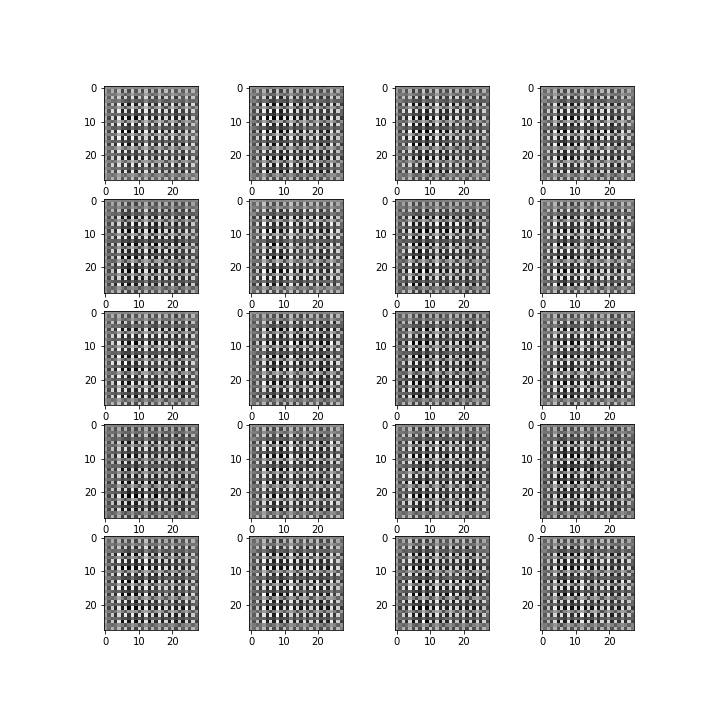

In [50]:
filename= 'basic_0'
make_gif('models/%s/apple.gif'%(filename), "models/%s/img/*.png"%(filename))
display.Image(filename=animation0)

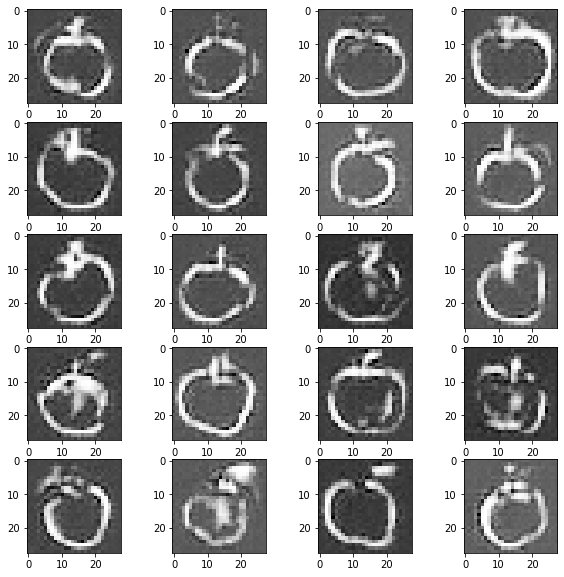

Time for epoch 50 is 13.414330959320068 sec


In [7]:
def generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    #model.add(Activation(square_activation))

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    #model.add(Activation(square_activation))    

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    #model.add(Activation(square_activation))
    
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)
    #model.compile(loss='binary_crossentropy', optimizer='adam')
    model.compile(loss='binary_crossentropy', optimizer='sgd')
    return model


def discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    #model.add(Activation(square_activation))
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    #model.add(Activation(square_activation))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    #model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    model.compile(loss='binary_crossentropy', optimizer='sgd')
    return model


def gan_model(generator, discriminator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    #gan.compile(loss='binary_crossentropy', optimizer='adam')
    gan.compile(loss='binary_crossentropy', optimizer='sgd')
    return gan

    
animation = full_training(generator_model, discriminator_model, gan_model, 5000, 50, 32, 'basic_1')

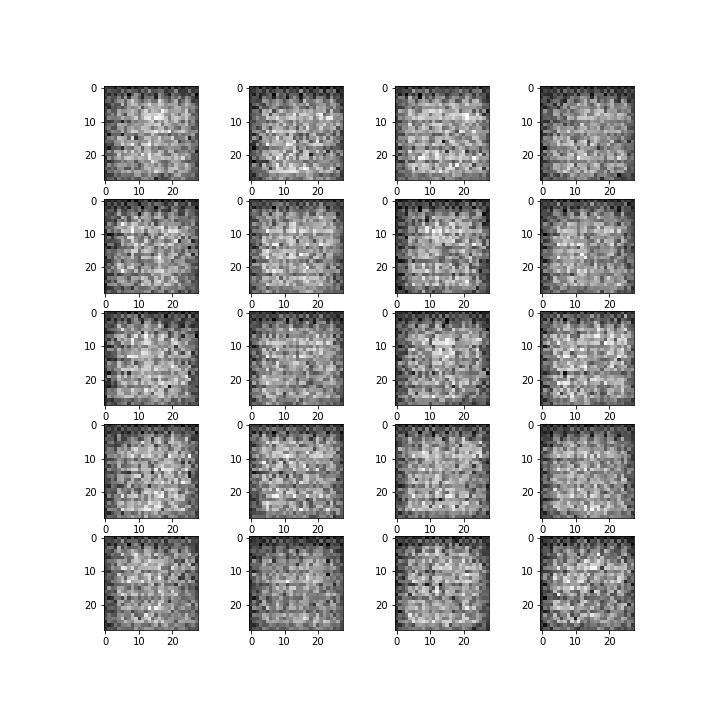

In [8]:
display.Image(filename=animation)

In [52]:
def generator_model_act(activation):

    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(Activation(activation)) ##Change with respect to previous

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(Activation(activation)) ##Change with respect to previous 

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(Activation(activation)) ##Change with respect to previous
    
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    #model.add(Activation(activation)) ##Change with respect to previous
    assert model.output_shape == (None, 28, 28, 1)
    model.compile(loss='binary_crossentropy', optimizer='sgd')
    
    return model


def discriminator_model_act(activation):

    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(Activation(activation)) ##Change with respect to previous
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(Activation(activation)) ##Change with respect to previous
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    #model.add(layers.Dense(1, activation='sigmoid'))
    model.add(Activation(activation)) ##Change with respect to previous
    model.compile(loss='binary_crossentropy', 
                  optimizer='sgd',
                  metrics=['accuracy'])
    return model


def gan_model_act(generator, discriminator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    #gan.compile(loss='binary_crossentropy', optimizer='adam')
    gan.compile(loss='binary_crossentropy', 
                optimizer='sgd')
    return gan
            
              
def test_activation_function(function):
    generator_act = lambda: generator_model_act(function)
    dicriminator_act = lambda: discriminator_model_act(function)
    gan_act = gan_model_act
    return generator_act, dicriminator_act, gan_act

## Approximating Activation Functions

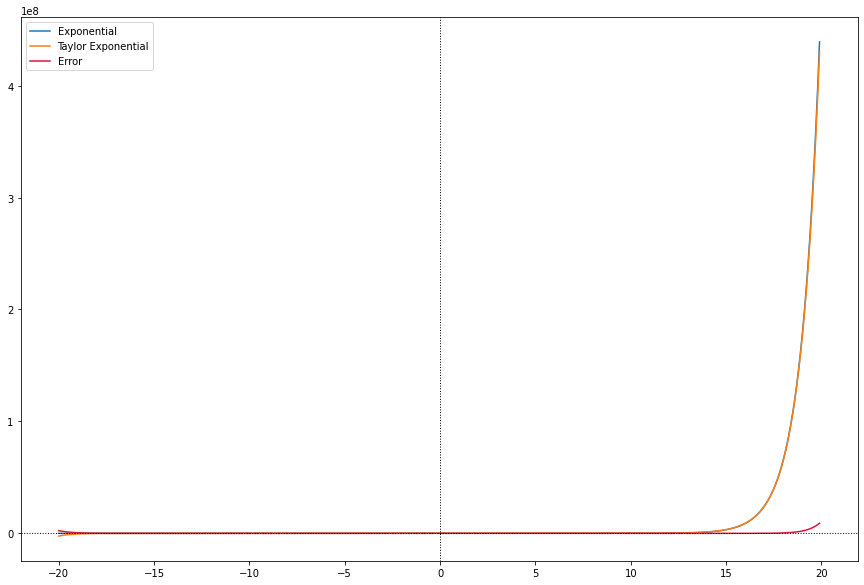

In [53]:
def taylor_exp(x, n=9):
    result = 1
    for i in range(1, n):
        result += ((x ** i) / (np.math.factorial(i)))
    return result 
r = 20
X = np.array(np.arange(-r, r, 0.1))
Y = np.array([np.exp(x) for x in X])
Y_hat = np.array([taylor_exp(x, 30) for x in X])

fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='Exponential')
plt.plot(X, Y_hat, label='Taylor Exponential')
plt.plot(X, np.abs(Y- Y_hat), label='Error', color='crimson')
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

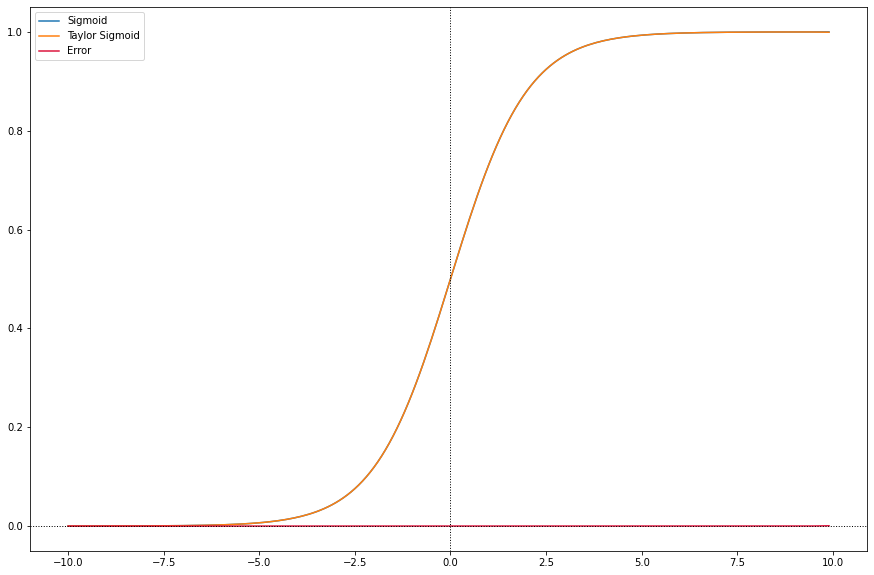

In [54]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def taylor_sigmoid(x, n=9):
    return 1 / (1 + taylor_exp(-x, n))

X = np.array(np.arange(-10, 10, 0.1))
Y = np.array([sigmoid(x) for x in X])
Y_hat = np.array([taylor_sigmoid(x, 31) for x in X])

fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='Sigmoid')
plt.plot(X, Y_hat, label='Taylor Sigmoid')
plt.plot(X, np.abs(Y- Y_hat), label='Error', color='crimson')
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

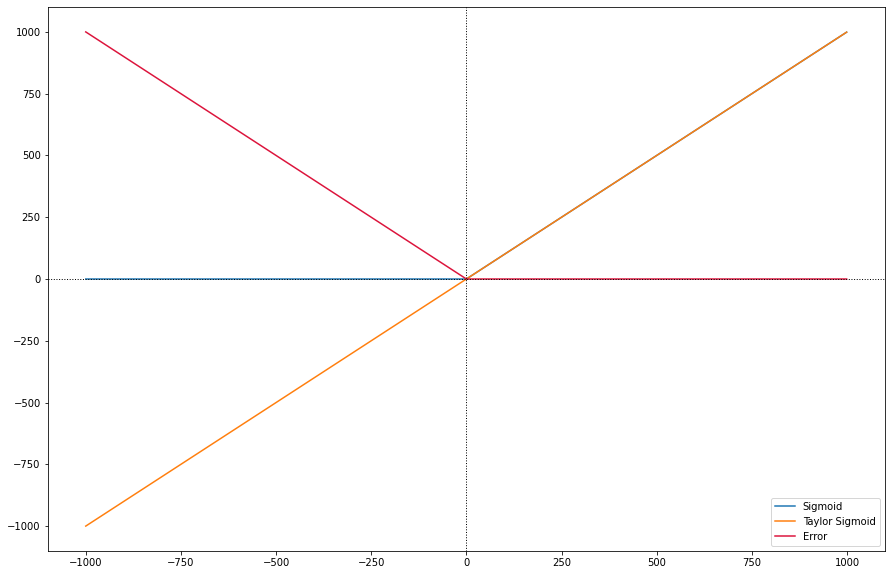

In [55]:
def taylor_max(x,y,k=10**20):
    ekx = taylor_exp(k * x)
    eky = taylor_exp(k * y)
    return (x * ekx + y * eky) / (ekx + eky)

def taylor_relu(x):
    return taylor_max(-1, x)
r = 1000
X = np.array(np.arange(-r, r, 1))
Y = np.array([max(0, x) for x in X])
Y_hat = np.array([taylor_max(x, 0) for x in X])
Y_hat = np.array([taylor_max(0, x) for x in X])

fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='Sigmoid')
plt.plot(X, Y_hat, label='Taylor Sigmoid')
plt.plot(X, np.abs(Y- Y_hat), label='Error', color='crimson')
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

In [56]:
from sklearn.linear_model import LinearRegression, Ridge

Degree 1 0.7999975999790812
[0.49999625] 2.4999999998066738
Degree 2 0.9874998499893175
[0.50000094 0.046875  ] 0.937499999927502
Degree 3 0.98749984999588
[4.99997656e-01 4.68750000e-02 5.46875255e-08] 0.9374999997634401
Degree 4 0.9968749624947512
[ 5.00001172e-01  8.20312500e-02 -2.73437628e-08 -4.10156250e-04] 0.5859374998521636
Degree 5 0.9968749624973293
[ 4.99997949e-01  8.20312500e-02  1.23046932e-07 -4.10156250e-04
 -1.35351626e-09] 0.585937499691014
Degree 6 0.9987792822231389
[ 5.00001282e-01  1.15356445e-01 -7.69043315e-08 -1.40991211e-03
  8.45947631e-10  7.33154298e-06] 0.4272460935247251
Degree 7 0.9987792822245122
[ 4.99998077e-01  1.15356445e-01  2.11486894e-07 -1.40991211e-03
 -5.49866040e-09  7.33154299e-06  3.92761518e-11] 0.4272460933646207
Degree 8 0.9994018482884857
[ 5.00001346e-01  1.48040772e-01 -1.48040482e-07 -3.20755005e-03
  3.84905583e-09  3.84906006e-05 -2.74933409e-11 -1.66923523e-07] 0.3364562985236432
Degree 9 0.9994018482893381
[ 4.99998149e-01  1.48

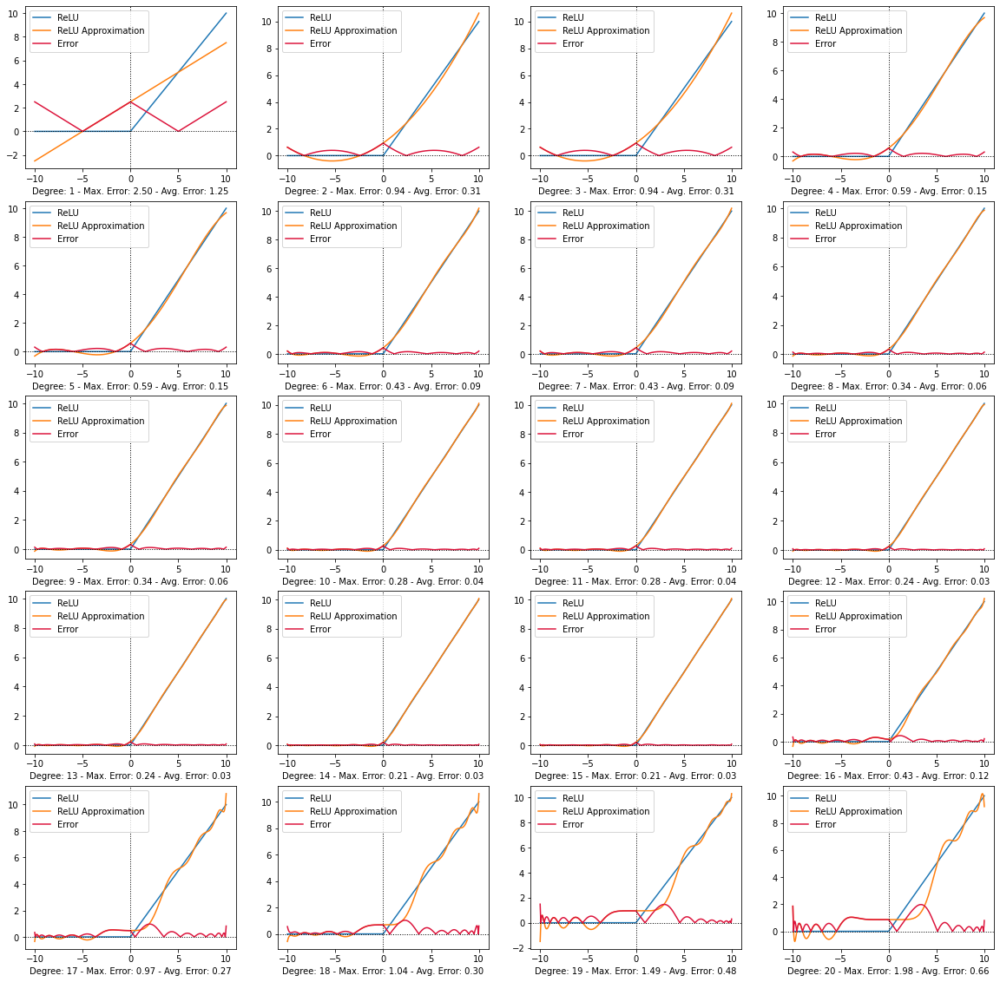

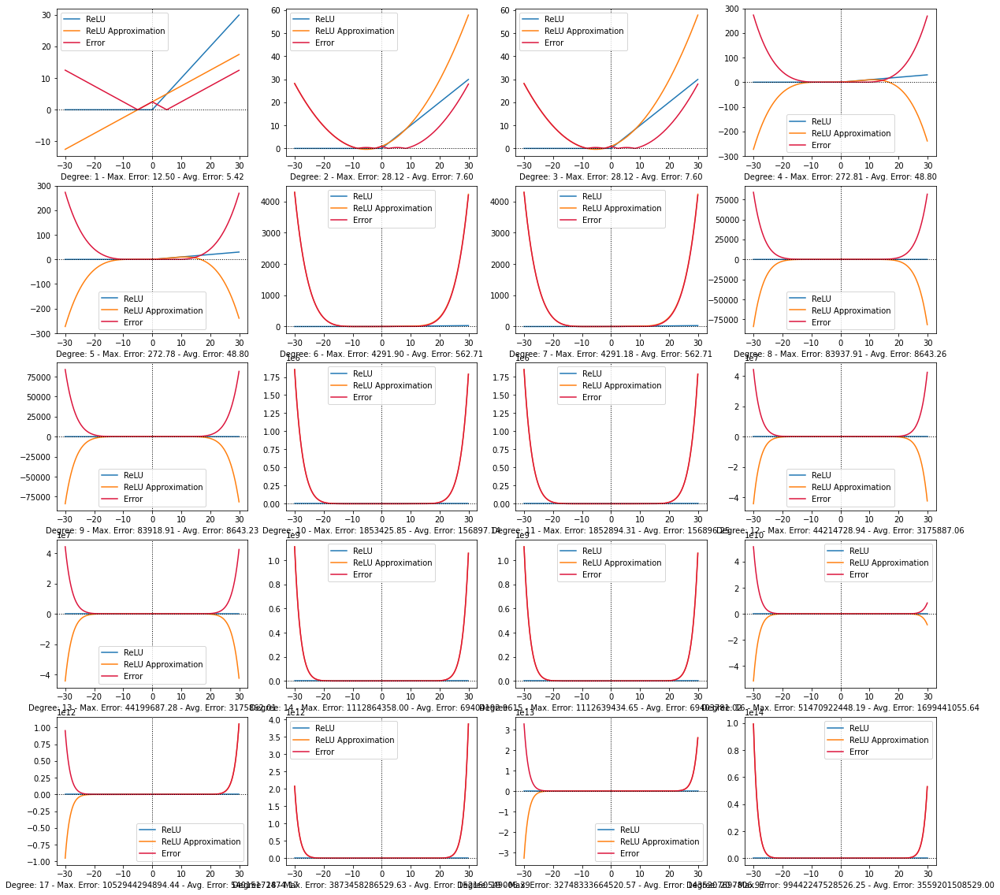

In [57]:
def expand_power(X, n):
    if n < 2:
        return X.reshape(1, len(X)).T
    Xt = X
    for i in range(2, n+1):
        Xn = X ** i
        Xt = np.concatenate([Xt, Xn])
    Xt = Xt.reshape(n, len(X)).T
    return Xt
    
def approximate_with_linear_regression(function, n = 9, r=10):
    if n == 0:
        print("ERROR")
        return
    
    #X = np.concatenate([np.arange(-1, 0, 10 ** -5), np.arange(0, 1, (10 ** -4) / 2)])
    X = np.arange(-r, r, 10**-4)
    Y = np.array([relu(i) for i in X])
    
    Xt = expand_power(X, n)
    
    
    #reg = Ridge(alpha=0.5).fit(Xt, Y)
    reg = LinearRegression().fit(Xt, Y)
    Y_hat = reg.predict(Xt)
    print("Degree %d" % (n), reg.score(Xt, Y))

    return reg, X, Y, Y_hat


def approximate_in_range(function, reg, r, n = 9):
    Xt = np.arange(-r, r, 10**-1)
    return Xt, [function(x) for x in Xt], reg.predict(expand_power(Xt, n))
    
def plot_graphs(X, Ys, config=(3,3)):
    w=20
    h=20
    fig=plt.figure(figsize=(w, h))
    columns = config[0]
    rows = config[1]
    for i in range(1, columns*rows +1):
        if i > len(Ys) - 1:
            break
        fig.add_subplot(rows, columns, i)
        err = np.abs(Ys[0]- Ys[i])
        plt.plot(X, Ys[0], label='ReLU')
        plt.plot(X, Ys[i], label='ReLU Approximation')
        plt.plot(X, err, label='Error', color='crimson')
        plt.xlabel('Degree: %d - Max. Error: %0.2f - Avg. Error: %0.2f' % (i, np.max(err), np.mean(err)))
        plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
        plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
        
        plt.legend()

    plt.show()
    plt.title('Approximations of ReLU function')
    plt.close()

# We define the ReLU function
relu = lambda x: max(x, 0)

# List of Y_predicted
Ys = list()
Ys2 = list()
coeffs = list()
regs = []
for degree  in range(1, 21):
    reg, X, Y, Y_hat = approximate_with_linear_regression(relu, degree)
    regs.append(reg)
    Xt, Yt, Yt_hat = approximate_in_range(relu, reg, 3 * 10, degree)
    
    if len(Ys) == 0:
        Ys.append(Y)
        Ys2.append(Yt)
    Ys.append(Y_hat)
    Ys2.append(Yt_hat)
    print(reg.coef_, reg.intercept_)
# Plot the configuration
plot_graphs(X, Ys, config=(4, 5))
plot_graphs(Xt, Ys2, config=(4, 5))

Degree 15 0.9998606269346592
[ 4.98607867e-01  2.44760805e-01  1.12783842e-04 -1.55015242e-02
 -3.47795219e-06  6.51064944e-04  2.93417664e-08 -1.52801044e-05
 -7.18060376e-11  1.98075434e-07  1.28426949e-12 -1.32595939e-09
 -1.14535118e-14  3.57549382e-12  2.77555756e-17] 0.20568957267320265


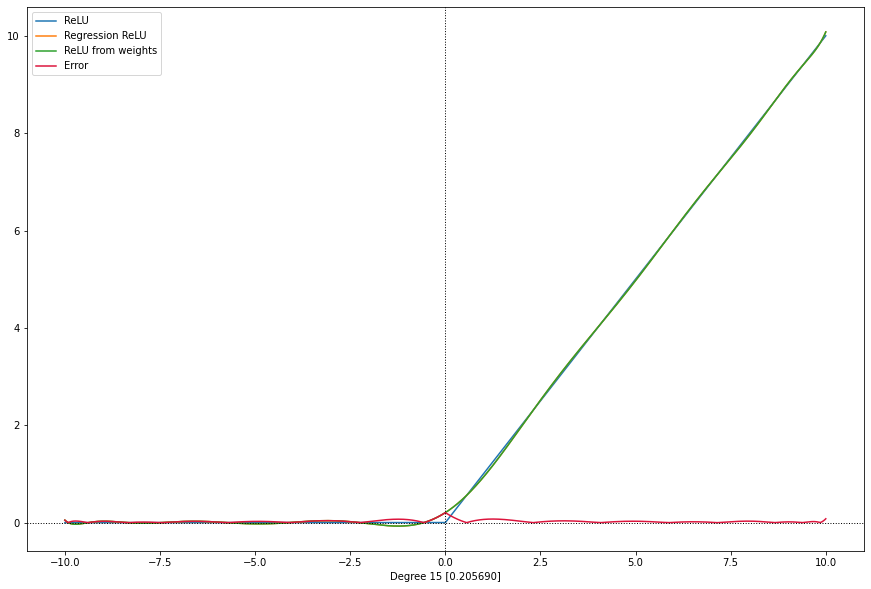

In [58]:
relu = lambda x: max(x, 0)
degree = 15
reg, X, Y, Y_hat = approximate_with_linear_regression(relu, degree, r= 10)
print(reg.coef_, reg.intercept_)
def relu_regression(x):
    coeffs = [ 4.98607867e-01,  2.44760805e-01,  1.12783842e-04, -1.55015242e-02,
              -3.47795219e-06,  6.51064944e-04,  2.93417664e-08, -1.52801044e-05,
              -7.18060376e-11,  1.98075434e-07,  1.28426949e-12, -1.32595939e-09,
              -1.14535118e-14,  3.57549382e-12,  2.77555756e-17]
    result = 0.20568957267320265
    for i, coef in enumerate(coeffs):
        result += (x ** (i+1)) * coef 
    return result

Y_hat_hat = np.array([relu_regression(i) for i in X])
fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='ReLU')
plt.plot(X, Y_hat, label='Regression ReLU')
plt.plot(X, Y_hat_hat, label='ReLU from weights')
plt.plot(X, np.abs(Y- Y_hat), label='Error', color='crimson')
plt.xlabel('Degree %d [%f]' % (degree, np.max(np.abs(Y- Y_hat))))
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

Degree 2 0.9874998499893175
[0.50000094 0.046875  ] 0.937499999927502


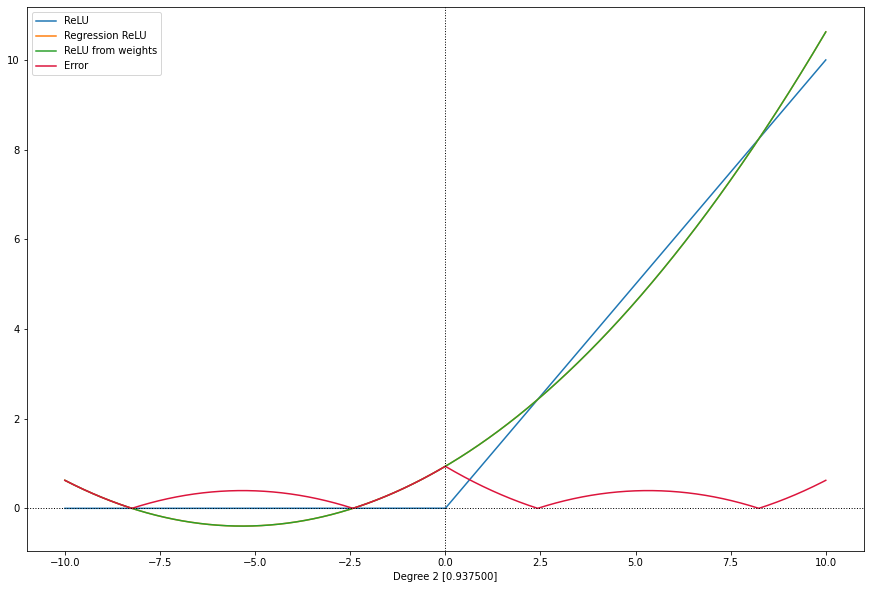

In [59]:
degree = 2
reg, X, Y, Y_hat = approximate_with_linear_regression(relu, degree, r=10)
print(reg.coef_, reg.intercept_)
def relu_regression(x):
    coeffs = [0.5000009, 0.046875]
    result = 0.9375000043248491
    for i, coef in enumerate(coeffs):
        result += (x ** (i+1)) * coef 
    return result 

Y_hat_hat = np.array([relu_regression(i) for i in X])
fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='ReLU')
plt.plot(X, Y_hat, label='Regression ReLU')
plt.plot(X, Y_hat_hat, label='ReLU from weights')
plt.plot(X, np.abs(Y- Y_hat), label='Error', color='crimson')
plt.xlabel('Degree %d [%f]' % (degree, np.max(np.abs(Y- Y_hat))))
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

-inf


/root/he-transformer/build/ext_ngraph_tf/src/ext_ngraph_tf/build_cmake/venv-tf-py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  


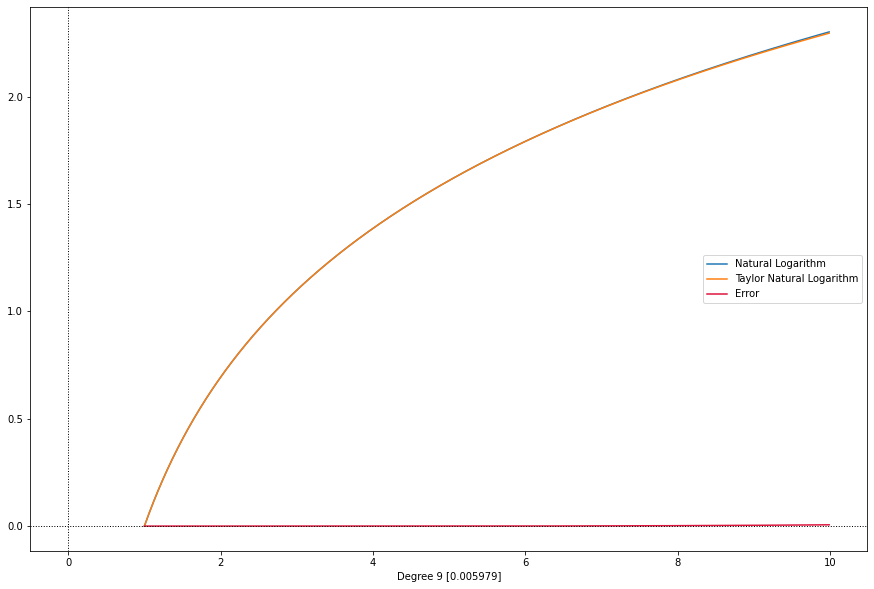

In [60]:
def taylor_ln(x, degree=9):
    result = 0
    for n in range(degree):
        t = (2 * n) + 1
        result += ((1 / t) * (((x - 1)/(x + 1))** t))
    return 2 * result

degree = 9
r = 10
X = np.arange(1, r, 10 ** -2)
Y = [np.log(x) for x in X]
Y_hat = np.array([taylor_ln(i, degree) for i in X])
err = np.abs(Y - Y_hat)
print(np.log(0))
fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='Natural Logarithm')
plt.plot(X, Y_hat, label='Taylor Natural Logarithm')
plt.plot(X, err, label='Error', color='crimson')
plt.xlabel('Degree %d [%f]' % (degree, np.max(err)))
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

4.15634498078973


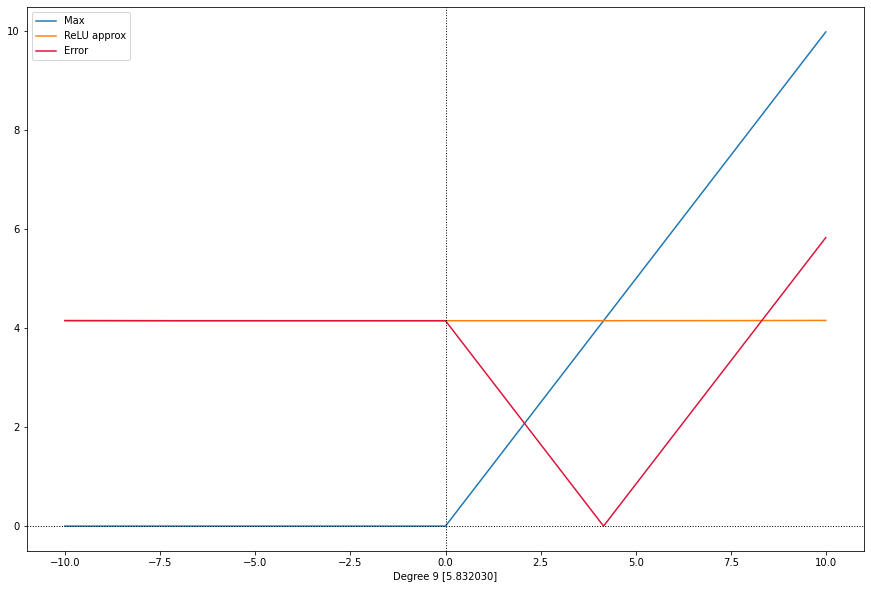

In [61]:
def soft_max(x, y, k=10**9):
    return np.log(np.exp(k * x)+np.exp(k * y))/k

def taylor_max(x, y, k=10**9):
    return taylor_ln(taylor_exp(k * x) + taylor_exp(k * y)) / k

def taylor_relu(x, k=10**9):
    return taylor_max(x, 9, k)

print(taylor_max(1, 10, 1))
r = 10
a = 3
#X = np.concatenate([np.arange(-1, 0, 10 ** -5), np.arange(0, 1, (10 ** -4) / 2)])
X = np.arange(-r, r, 10**-2)
Y = [max(x, 0) for x in X]
Y_hat = np.array([taylor_relu(i, 1) for i in X])
err = np.abs(Y - Y_hat)
fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='Max')
plt.plot(X, Y_hat, label='ReLU approx')
plt.plot(X, err, label='Error', color='crimson')
plt.xlabel('Degree %d [%f]' % (degree, np.max(err)))
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

4.15634498078973


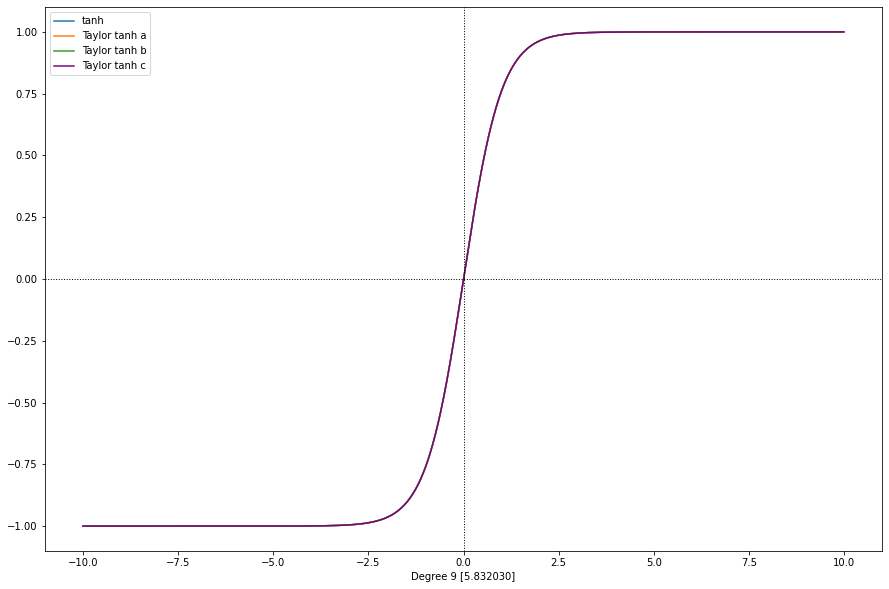

In [62]:
def taylor_tanh_a(x, n=9):
    a = 2
    b = (1 + np.exp(-2 * x))
    c = -1
    return a / b + c

def taylor_tanh_b(x, n=9):
    return np.sinh(x) / np.cosh(x)

def taylor_tanh_c(x, n=50):
    a = np.exp(2 * x)
    return (a - 1) / (a + 1)


print(taylor_max(1, 10, 1))
r = 10
#X = np.concatenate([np.arange(-1, 0, 10 ** -5), np.arange(0, 1, (10 ** -4) / 2)])
X = np.arange(-r, r, 10**-2)
Y = [np.tanh(x) for x in X]
Y_hat_a = np.array([taylor_tanh_a(x) for x in X])
Y_hat_b = np.array([taylor_tanh_b(x) for x in X])
Y_hat_c = np.array([taylor_tanh_c(x) for x in X])
#err = np.abs(Y - Y_hat)
fig=plt.figure(figsize=(15, 10))
plt.plot(X, Y, label='tanh')
plt.plot(X, Y_hat_a, label='Taylor tanh a')
plt.plot(X, Y_hat_b, label='Taylor tanh b')
plt.plot(X, Y_hat_c, label='Taylor tanh c', color='purple')
#plt.plot(X, err, label='Error', color='crimson')
plt.xlabel('Degree %d [%f]' % (degree, np.max(err)))
#plt.grid(True, axis='both')
plt.axhline(y=0, color='k', linestyle=':', linewidth=1)
plt.axvline(x=0, color='k', linestyle=':', linewidth=1)
plt.legend()

## Using the square function (Most Efficient)
In the code below, we train the adversarial network making use of the square function as activation function. It provides the advantage that it is really efficient in the "encrypted" domain, however, the results do not seem to be promising or the neural network to be learning.

Although it seems to work, at times, the exploding gradient problem comes. Due to the fact that the $x^2$ squares numbers, all numbers inbetween 0 and 1 get reduced ($-1 <= x <= 1$), but numbers bigger than 1 ($x > 1$) or smaller than -1 ($x < -1$) , get highly increased.

In [63]:
def square_activation(x):
    return x * x

gen_model_act, disc_mod_act, gan_mod_act = test_activation_function(square_activation)
animation2 = full_training(gen_model_act, disc_mod_act, gan_mod_act, 5000, 50, 32, 'square')

Directory  models/square  already exists


ValueError: A target array with shape (64, 1) was passed for an output of shape (None, 6272) while using as loss `binary_crossentropy`. This loss expects targets to have the same shape as the output.

In [ ]:
display.Image(filename=animation2)

## Using the taylor approximation for sigmoid
In the code below, we train the adversarial network making use of the sigmoid taylor polynomial approximation.

In [ ]:
gen_model_act, disc_mod_act, gan_mod_act = test_activation_function(taylor_sigmoid)
animation3 = full_training(gen_model_act, disc_mod_act, gan_mod_act, 5000, 50, 32, 'taylor_sigmoid')

In [ ]:
display.Image(filename=animation3)

## Trying the ReLU regression as activation function

In [ ]:
gen_model_act, disc_mod_act, gan_mod_act = test_activation_function(relu_regression)
animation4 = full_training(gen_model_act, disc_mod_act, gan_mod_act, 5000, 50, 32, 'relu_regression')

In [ ]:
display.Image(filename=animation4)

## Mixing all the activations

In [ ]:
def generator_model_cust():

    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(Activation(relu_regression)) ##Change with respect to previous

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(Activation(relu_regression)) ##Change with respect to previous 

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(Activation(relu_regression)) ##Change with respect to previous
    
    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(Activation(taylor_sigmoid)) ##Change with respect to previous
    assert model.output_shape == (None, 28, 28, 1)
    model.compile(loss='binary_crossentropy', optimizer='sgd')
    
    return model


def discriminator_model_cust():

    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(Activation(relu_regression)) ##Change with respect to previous
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(Activation(relu_regression)) ##Change with respect to previous
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))
    model.add(Activation(taylor_sigmoid)) ##Change with respect to previous
    model.compile(loss='binary_crossentropy', 
                  optimizer='sgd',
                  metrics=['accuracy'])
    return model


def gan_model_cust(generator, discriminator):
    discriminator.trainable=False
    gan_input = Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)
    #gan.compile(loss='binary_crossentropy', optimizer='adam')
    gan.compile(loss='binary_crossentropy', optimizer='sgd')
    return gan
            
              
animation5 = full_training(generator_model_cust, discriminator_model_cust, 
                           gan_model_cust, 5000, 50, 32, 
                           'relu_regression_sigmoid_taylor')

In [ ]:
display.Image(filename=animation5)

## Exporting the NN to PB format

In [ ]:
tf.reset_default_graph()
sess = tf.compat.v1.Session()
generator, discriminator = None, None
def my_event_handler(btn_object):
    global generator
    model = btn_object.description
    print("Loading %s model..." % (model), end='\r')
    
    generator = tf.keras.models.load_model('models/%s/generator.h5' % (model), 
                                           custom_objects={'relu_regression':relu_regression, 
                                                           'taylor_sigmoid':taylor_sigmoid})
    #discriminator = tf.keras.models.load_model('models/%s/discriminator.h5' %(model))
    print("Loaded %s model     " % (model))
    
print("Click on a model to load it:")
dirs = os.listdir( 'models/' )
for d in dirs:
    btn = widgets.Button(description=d)
    btn.on_click(my_event_handler)
    display.display(btn)

In [ ]:
generator.summary()

In [ ]:
from tensorflow.core.protobuf import rewriter_config_pb2
from tensorflow.python.tools import freeze_graph

def print_nodes(graph_def=None):
    """Prints the node names of a graph_def.
        If graph_def is not provided, use default graph_def"""

    if graph_def is None:
        nodes = [n.name for n in tf.get_default_graph().as_graph_def().node]
    else:
        nodes = [n.name for n in graph_def.node]

    print("nodes", nodes)

# https://www.dlology.com/blog/how-to-convert-trained-keras-model-to-tensorflow-and-make-prediction/
def freeze_session(session,
                   keep_var_names=None,
                   output_names=None,
                   clear_devices=True):
    """
    Freezes the state of a session into a pruned computation graph.

    Creates a new computation graph where variable nodes are replaced by
    constants taking their current value in the session. The new graph will be
    pruned so subgraphs that are not necessary to compute the requested
    outputs are removed.
    @param session The TensorFlow session to be frozen.
    @param keep_var_names A list of variable names that should not be frozen,
                          or None to freeze all the variables in the graph.
    @param output_names Names of the relevant graph outputs.
    @param clear_devices Remove the device directives from the graph for better portability.
    @return The frozen graph definition.
    """
    from tensorflow.python.framework.graph_util import (
        convert_variables_to_constants,
        remove_training_nodes,
    )

    graph = session.graph
    with graph.as_default():
        freeze_var_names = list(
            set(v.op.name for v in tf.global_variables()).difference(
                keep_var_names or []))
        output_names = output_names or []
        output_names += [v.op.name for v in tf.global_variables()]
        # Graph -> GraphDef ProtoBuf
        input_graph_def = graph.as_graph_def()
        print_nodes(input_graph_def)
        if clear_devices:
            for node in input_graph_def.node:
                node.device = ""
        frozen_graph = convert_variables_to_constants(
            session, input_graph_def, output_names, freeze_var_names)
        frozen_graph = remove_training_nodes(frozen_graph)
        return frozen_graph
    
def save_model(sess, output_names, directory, filename):
    frozen_graph = freeze_session(sess, output_names=output_names)
    print_nodes(frozen_graph)
    tf.io.write_graph(frozen_graph, directory, filename + ".pb", as_text=False)
    print("Model saved to: %s" % filename + ".pb")


In [ ]:
sess = tf.compat.v1.keras.backend.get_session()

create_dir('models/private/')
save_model(sess, ["activation_94_1/truediv_8"], "models/private/", 'cryptogan')

In [ ]:


def load_pb_file(filename):
    """"Returns the graph_def from a saved protobuf file"""
    if not os.path.isfile(filename):
        raise Exception("File, " + filename + " does not exist")

    with tf.io.gfile.GFile(filename, "rb") as f:
        graph_def = tf.compat.v1.GraphDef()
        graph_def.ParseFromString(f.read())

    print("Model restored")
    return graph_def



